In [274]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from scipy.misc import imread, imresize, imshow
import cv2
import os
import time
from hashlib import md5
import scipy

In [275]:
IMAGE_DIR = 'D:\\Program Files\\Project\\Images\\Happy Anniversary'

os.chdir(IMAGE_DIR)
os.getcwd()

'D:\\Program Files\\Project\\Images\\Happy Anniversary'

In [276]:
image_files = os.listdir()
print(len(image_files))

20


In [277]:
image_files[0]

'1.jpg'

In [278]:
imread(image_files[0]).shape

D:\Program Files\Anaconda 3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


(185, 272, 3)

In [279]:
def filter_images(images):
    image_list = []
    for image in images:
            try:
                assert imread(image).shape[2] == 3
                image_list.append(image)
            except AssertionError as e:
                    print(e)
    return image_list

In [280]:
#First turn the image into a gray scale image

def img_gray(image):
    image = imread(image)
    return np.average(image, weights=[0.299, 0.587, 0.114], axis=2)

In [281]:
#resize image and 


def resize(image, height=30, width=30):
    row_res = cv2.resize(image,(height,width), interpolation = cv2.INTER_AREA).flatten()
    col_res = cv2.resize(image,(height,width), interpolation = cv2.INTER_AREA).flatten()
    return row_res, col_res

In [282]:
np.random.randint(1,8, size =(2,4))

array([[1, 3, 4, 2],
       [6, 4, 3, 2]])

In [283]:
#gradient direction based on intensity

def intensity_diff(row_res, col_res):
    difference_row = np.diff(row_res)
    difference_col = np.diff(col_res)
    difference_row = difference_row > 0
    difference_col = difference_col > 0
    return np.vstack((difference_row, difference_col)).flatten()
    #return difference_row
    #return np.vstack((difference_row, difference_col)) #str method

In [284]:
x=np.random.randint(1,5,size = (1,5))
y=np.random.randint(1,5, size = (1,5))

In [285]:
x,y

(array([[1, 2, 1, 3, 2]]), array([[2, 4, 4, 3, 4]]))

In [286]:
x.shape, y.shape

((1, 5), (1, 5))

In [287]:
np.vstack((x,y)).shape

(2, 5)

In [288]:
np.vstack((x,y))

array([[1, 2, 1, 3, 2],
       [2, 4, 4, 3, 4]])

In [289]:
np.vstack((x,y)).flatten()

array([1, 2, 1, 3, 2, 2, 4, 4, 3, 4])

In [290]:
x = np.hstack((x,y))

In [291]:
x

array([[1, 2, 1, 3, 2, 2, 4, 4, 3, 4]])

In [292]:
x > 1


array([[False,  True, False,  True,  True,  True,  True,  True,  True,
         True]])

In [293]:
np.diff(x)

array([[ 1, -1,  2, -1,  0,  2,  0, -1,  1]])

In [294]:
def file_hash(array):
    return md5(array).hexdigest()

In [295]:
def difference_score(image, height = 30, width = 30):
    gray = img_gray(image)
    row_res, col_res = resize(gray, height, width)
    difference = intensity_diff(row_res, col_res)
    
    return difference

In [296]:
def difference_score_dict_hash(image_list):
    ds_dict = {}
    duplicates = []
    hash_ds = []
    for image in image_list:
        ds = difference_score(image)
        hash_ds.append(ds)
        filehash = md5(ds).hexdigest()
        if filehash not in ds_dict:
            ds_dict[filehash] = image
        else:
            duplicates.append((image, ds_dict[filehash]))
    return duplicates, ds_dict, hash_ds

In [297]:
image_files = filter_images(image_files)
duplicates, ds_dict, hash_ds = difference_score_dict_hash(image_files)

D:\Program Files\Anaconda 3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """
D:\Program Files\Anaconda 3\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  after removing the cwd from sys.path.


In [298]:
len(duplicates)

0

In [299]:
for file_names in duplicates[:30]:
    try:
        plt.subplot(121),plt.imshow(imread(file_names[0]))
        plt.title('Duplicate'),plt.xticks([]), plt.yticks([])
        
        plt.subplot(122),plt.imshow(imread(file_names[1]))
        plt.title('Original'),plt.xticks([]),plt.yticks([])
        plt.show()
        
    except OSError as e:
            continue

In [300]:
def hamming_distance(image, image2):
    score = scipy.spatial.distance.hamming(image, image2)
    return score

In [301]:
#Hamming 

def difference_score_dict(image_list):
    ds_dict = {}
    duplicates = []
    for image in image_list:
        ds = difference_score(image)
        
        if image not in ds_dict:
            ds_dict[image] = ds
        else:
            duplicates.append((image, ds_dict[image]))
            
    return duplicates, ds_dict 

In [302]:
images_files = filter_images(image_files)
duplicates, ds_dict =difference_score_dict(image_files)

D:\Program Files\Anaconda 3\lib\site-packages\ipykernel_launcher.py:5: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """
D:\Program Files\Anaconda 3\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  after removing the cwd from sys.path.


In [303]:
len(duplicates)

0

In [304]:
len(ds_dict.keys())

20

In [305]:
import itertools
for k1,k2 in itertools.combinations(ds_dict, 2):
    if hamming_distance(ds_dict[k1], ds_dict[k2])< .510:
        duplicates.append((k1,k2))

In [306]:
len(duplicates)

133

D:\Program Files\Anaconda 3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until
D:\Program Files\Anaconda 3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


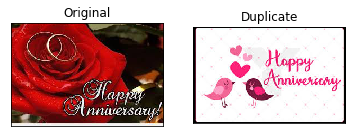

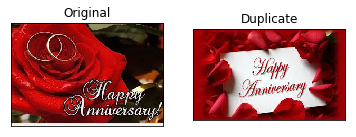

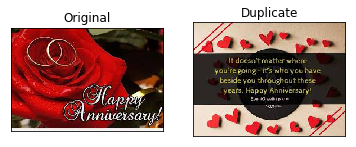

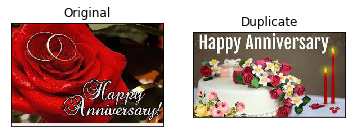

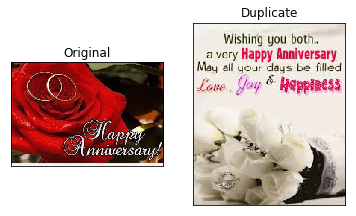

...

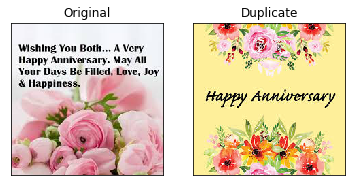

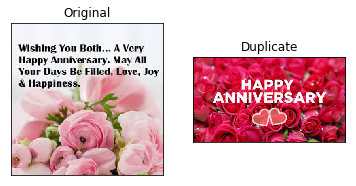

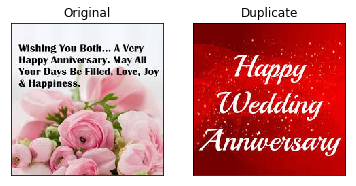

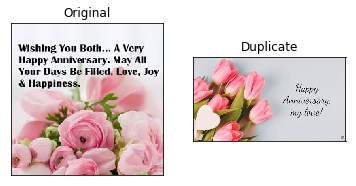

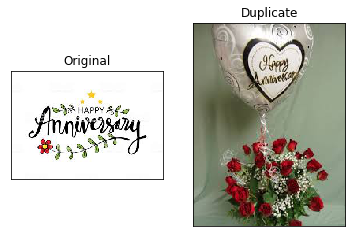

In [307]:
for file_names in duplicates[:100]:
    try:
        plt.subplot(121),plt.imshow(imread(file_names[0]))
        plt.title('Original'), plt.xticks([]), plt.yticks([])
        
        plt.subplot(122),plt.imshow(imread(file_names[1]))
        plt.title('Duplicate'), plt.xticks([]),plt.yticks([])
        plt.show()
        
    except OSError as e:
            continue